The project focused on mining traffic data and using TGCNN (temporal Graph nn) to predict future street flows

# Installs + Imports

In [ ]:
import numpy as np
import pandas as pd
import gdown
import matplotlib.pyplot as plt
import networkx as nx
import random
import argparse
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import math
from torch.optim.lr_scheduler import StepLR
from google.colab import files
import datetime
import torch
import torch.nn.functional as F
from sklearn.preprocessing import  MinMaxScaler

# Downloads + Load Files

In [ ]:
file_id = '1LqNFZsuEjJp714s8u0cP3Ed5whekf9Zq'
output = '2017_his.h5'
gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1LqNFZsuEjJp714s8u0cP3Ed5whekf9Zq
From (redirected): https://drive.google.com/uc?id=1LqNFZsuEjJp714s8u0cP3Ed5whekf9Zq&confirm=t&uuid=02fb8c0c-0ee9-417c-b76a-2dff3d40c7b9
To: /content/2017_his.h5
100%|██████████| 146M/146M [00:01<00:00, 109MB/s]


'2017_his.h5'

In [ ]:
file_id = '1B2YsyMZxf4ImCHt7APewb_2XmOF-OhAA'
output = 'metadata.csv'
gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1B2YsyMZxf4ImCHt7APewb_2XmOF-OhAA
To: /content/metadata.csv
100%|██████████| 11.9k/11.9k [00:00<00:00, 29.0MB/s]


'metadata.csv'

In [ ]:
file_id = '1GPEf2G9IK0ZWL1jvP7NZC4RoaCsbeA7X'
output = 'adj_matrix.csv'
gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1GPEf2G9IK0ZWL1jvP7NZC4RoaCsbeA7X
To: /content/adj_matrix.csv
100%|██████████| 240k/240k [00:00<00:00, 41.3MB/s]


'adj_matrix.csv'

In [ ]:
meta = pd.read_csv('/content/metadata.csv')
adj_matrix = np.load('/content/adj_matrix.csv')
data_2017 = pd.read_hdf('/content/2017_his.h5')

# Data Preprocessing

In [ ]:
data_2017.head()

,716272,716273,717367,717369,718130,717376,717373,717379,717381,717383,...,717660,768984,718151,717983,717963,716847,717970,717975,717972,761776
Time,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,9.0,30.0,63.0,55.0,64.0,53.0,56.0,63.0,56.0,61.0,...,85.0,152.0,92.0,74.0,74.0,51.0,88.0,90.0,98.0,82.0
2017-01-01 00:05:00,18.0,31.0,49.0,48.0,47.0,48.0,44.0,58.0,48.0,64.0,...,94.0,168.0,117.0,81.0,62.0,56.0,90.0,101.0,99.0,72.0
2017-01-01 00:10:00,16.0,38.0,60.0,62.0,57.0,68.0,58.0,85.0,93.0,80.0,...,92.0,156.0,111.0,90.0,86.0,54.0,76.0,97.0,95.0,79.0
2017-01-01 00:15:00,39.0,59.0,104.0,104.0,108.0,113.0,113.0,115.0,138.0,137.0,...,105.0,212.0,162.0,122.0,105.0,82.0,113.0,148.0,149.0,105.0
2017-01-01 00:20:00,28.0,67.0,141.0,152.0,140.0,144.0,136.0,141.0,162.0,199.0,...,166.0,242.0,187.0,165.0,116.0,123.0,169.0,193.0,195.0,139.0


In [ ]:
print((data_2017.isna().sum() == 0).sum(), '/', data_2017.shape[1], 'columns have no NaNs')

0 / 173 columns have no NaNs


In [ ]:
full_nan_rows = data_2017.isna().all(axis=1)
num_full_nan_rows = full_nan_rows.sum()

print(f"Fully NaN rows in data_2017: {num_full_nan_rows} out of {len(data_2017)} total rows")

Fully NaN rows in data_2017: 12 out of 105120 total rows


In [ ]:
data_2017.interpolate(method='linear', limit_direction='both', inplace=True)

In [ ]:
valid_cols_2017 = data_2017.dropna(axis=1).columns

In [ ]:
print(f"data_2017 has {len(valid_cols_2017)}/{len(data_2017.columns)} non-NaN columns")

data_2017 has 172/173 non-NaN columns


In [ ]:
data_2017 = data_2017[valid_cols_2017]

In [ ]:
data_2017.head()

,716272,716273,717367,717369,718130,717376,717373,717379,717381,717383,...,717660,768984,718151,717983,717963,716847,717970,717975,717972,761776
Time,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,9.0,30.0,63.0,55.0,64.0,53.0,56.0,63.0,56.0,61.0,...,85.0,152.0,92.0,74.0,74.0,51.0,88.0,90.0,98.0,82.0
2017-01-01 00:05:00,18.0,31.0,49.0,48.0,47.0,48.0,44.0,58.0,48.0,64.0,...,94.0,168.0,117.0,81.0,62.0,56.0,90.0,101.0,99.0,72.0
2017-01-01 00:10:00,16.0,38.0,60.0,62.0,57.0,68.0,58.0,85.0,93.0,80.0,...,92.0,156.0,111.0,90.0,86.0,54.0,76.0,97.0,95.0,79.0
2017-01-01 00:15:00,39.0,59.0,104.0,104.0,108.0,113.0,113.0,115.0,138.0,137.0,...,105.0,212.0,162.0,122.0,105.0,82.0,113.0,148.0,149.0,105.0
2017-01-01 00:20:00,28.0,67.0,141.0,152.0,140.0,144.0,136.0,141.0,162.0,199.0,...,166.0,242.0,187.0,165.0,116.0,123.0,169.0,193.0,195.0,139.0


In [ ]:
valid_node_ids = [int(c) for c in valid_cols_2017]
idxs = [meta.index[meta['ID'] == nid][0] for nid in valid_node_ids]
meta = meta[meta['ID'].isin(valid_node_ids)].reset_index(drop=True)
adj_matrix = adj_matrix[np.ix_(idxs, idxs)]

In [ ]:
print(adj_matrix.shape)
print(meta.shape)

(172, 172)
(172, 10)


In [ ]:
meta.head()

,ID,Lat,Lng,District,County,Fwy,Lanes,Type,Direction,ID2
0,716272,33.872586,-118.289005,7,Los Angeles,SR91-E,3,Mainline,E,4223
1,716273,33.872636,-118.281200,7,Los Angeles,SR91-E,3,Mainline,E,4224
2,717367,33.872471,-118.270740,7,Los Angeles,SR91-E,5,Mainline,E,4225
3,717369,33.873324,-118.264042,7,Los Angeles,SR91-E,4,Mainline,E,4226
4,718130,33.873486,-118.259531,7,Los Angeles,SR91-E,4,Mainline,E,4227


In [ ]:
print(adj_matrix[:6, :6])

[[1.         0.97372286 0.86543773 0.76231456 0.68522557 0.54376874]
 [0.55482018 1.         0.95386323 0.8796239  0.81547952 0.68279065]
 [0.3755967  0.26478754 1.         0.98037081 0.94642101 0.85188808]
 [0.19780984 0.12726377 0.06503521 1.         0.99122786 0.93484025]
 [0.24900489 0.16501328 0.08792313 0.3780158  1.         0.97291387]
 [0.09174907 0.05394786 0.02451876 0.16026567 0.12322336 1.        ]]


# Exploratory Data Analysis

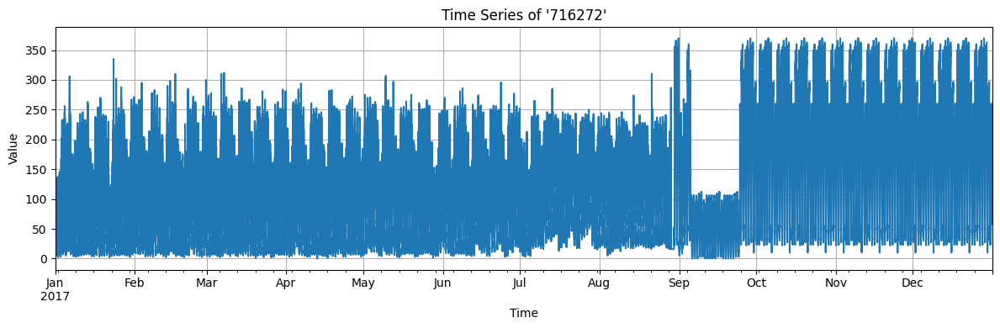

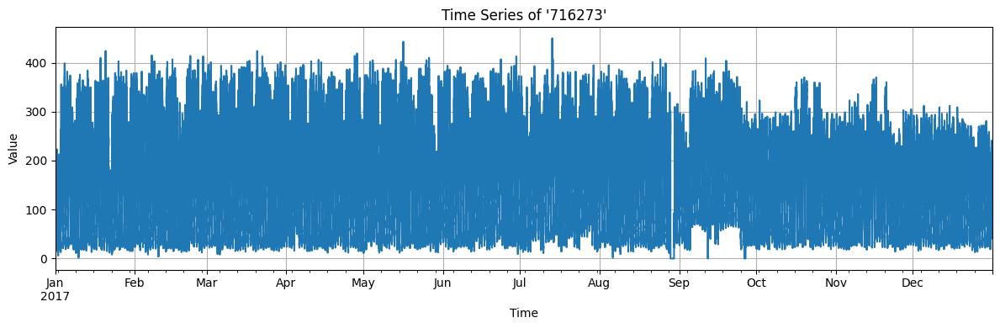

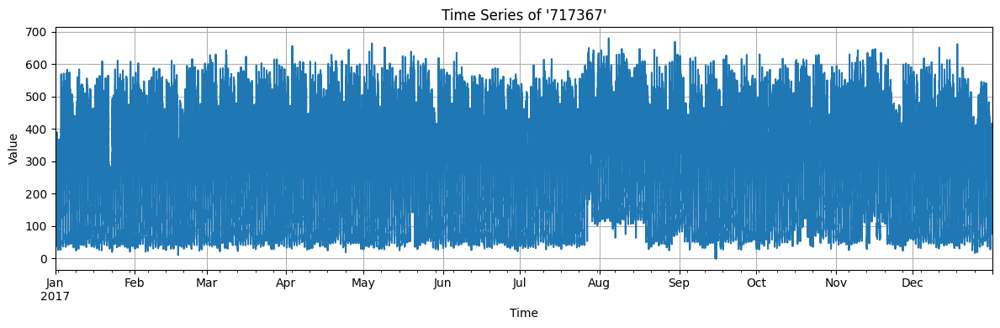

In [ ]:
for i in range(3):
    col = data_2017.columns[i]
    plt.figure(figsize=(12, 4))
    data_2017[col].plot()
    plt.title(f"Time Series of '{col}'")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

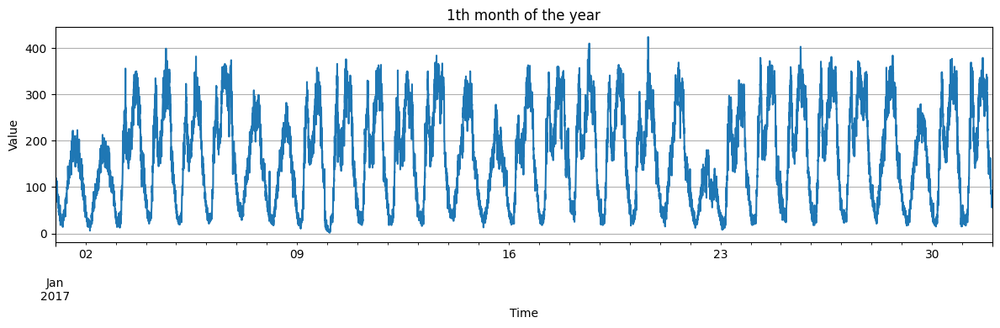

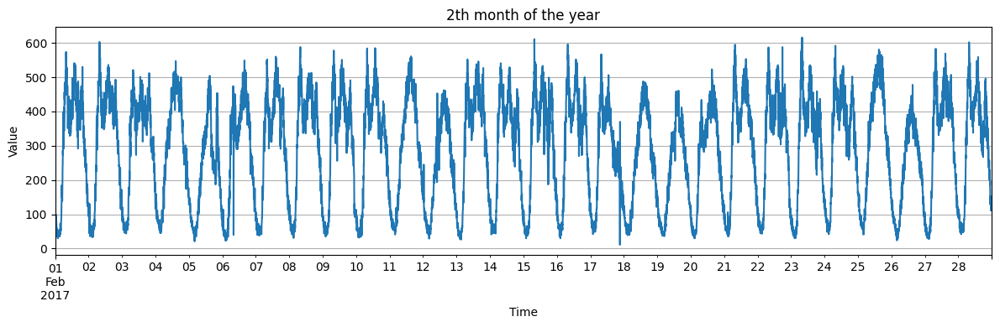

In [ ]:
for i in range(1, 3):
    col = data_2017.columns[i]
    plt.figure(figsize=(12, 4))
    data_2017[col].loc["2017-0" + str(i)].plot()
    plt.title(f"{i}th month of the year")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

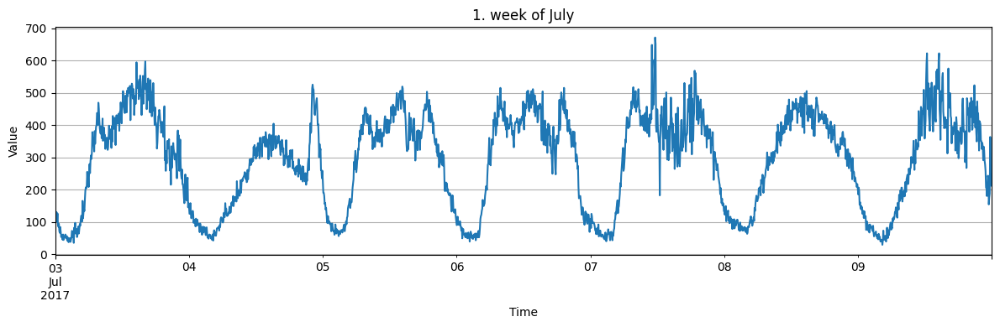

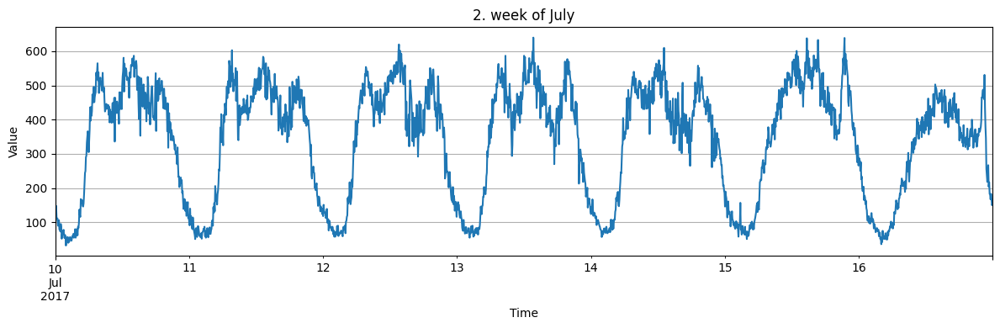

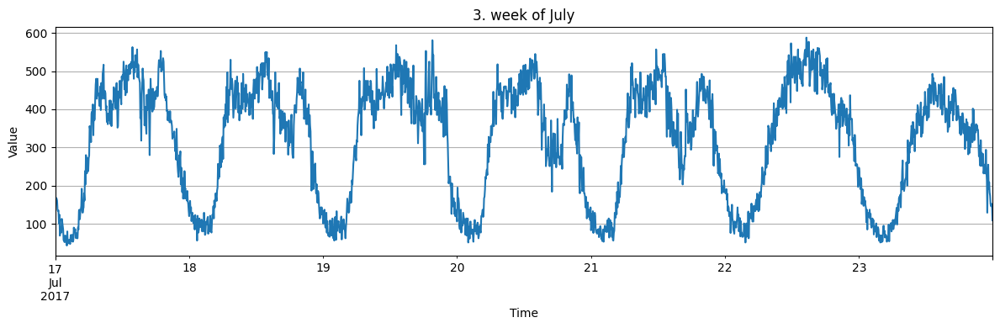

In [ ]:
for i in range(7, 10):
    col = data_2017.columns[i]
    plt.figure(figsize=(12, 4))
    if i == 7:
      data_2017[col].loc["2017-07-0" + str(7*(i-7)+3):"2017-07-0" + str(7*(i-7)+9)].plot()
    else:
      data_2017[col].loc["2017-07-" + str(7*(i-7)+3):"2017-07-" + str(7*(i-7)+9)].plot()
    plt.title(f"{i-6}. week of July")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

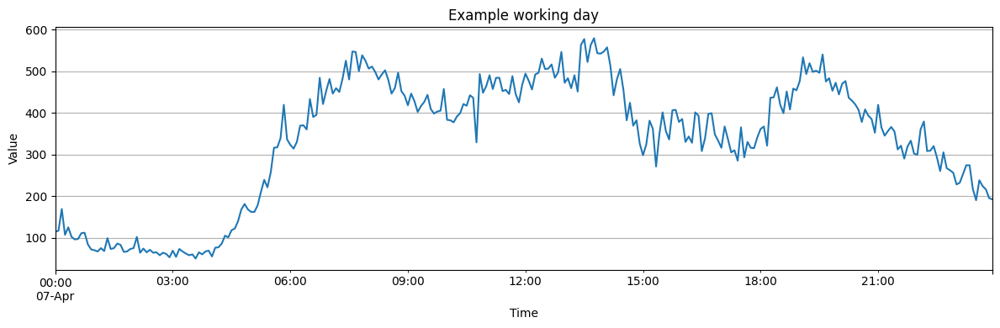

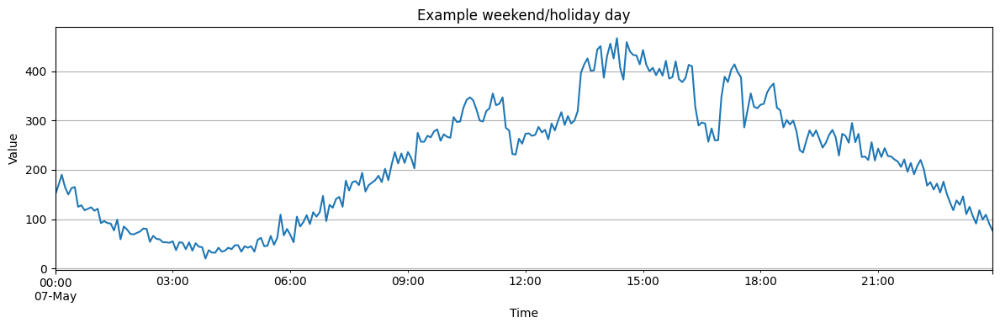

In [ ]:
for i in range(4, 6):
    col = data_2017.columns[i]
    plt.figure(figsize=(12, 4))
    data_2017[col].loc["2017-0" + str(i) + "-07"].plot()
    if i == 4:
        plt.title(f"Example working day")
    else:
        plt.title(f"Example weekend/holiday day")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

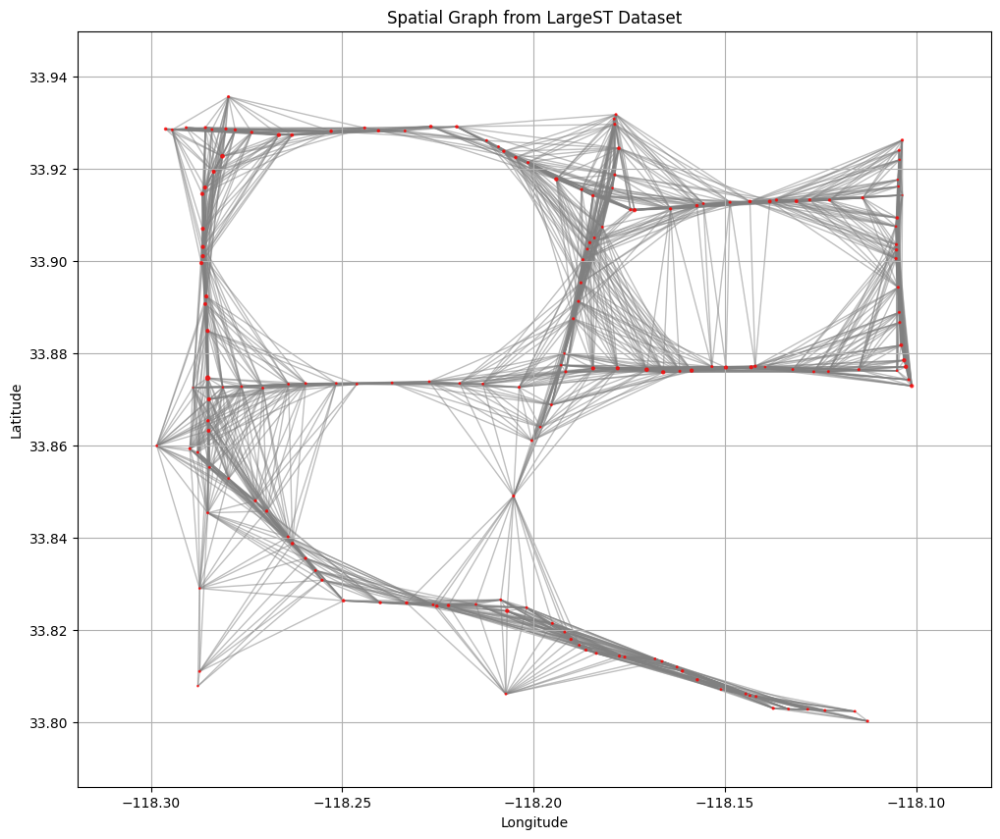

In [ ]:
data_2017_first_row = data_2017.iloc[0]
node_size_map = {int(col): data_2017_first_row[col] for col in data_2017.columns}
node_sizes = [node_size_map.get(node_id, 0) / 2500 for node_id in meta['ID']]

scale_factor = 50
node_sizes = [max(size, 0) * scale_factor for size in node_sizes]

G = nx.Graph()

for i, row in meta.iterrows():
    G.add_node(i, pos=(row['Lng'], row['Lat']), node_id=row['ID'])

rows, cols = np.where(adj_matrix > 0)
for i, j in zip(rows, cols):
    if i < j:
        G.add_edge(i, j)

pos = nx.get_node_attributes(G, 'pos')

fig, ax = plt.subplots(figsize=(12, 10))

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='red', alpha=0.7, ax=ax)
nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='gray', ax=ax)

ax.set_title("Spatial Graph from LargeST Dataset")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

plt.show()


In [ ]:
node_x = meta['Lng'].values
node_y = meta['Lat'].values

def get_node_sizes_from_row(row):
    node_size_map = {int(col): row[col] / 1000 for col in data_2017.columns}
    scale_factor = 50
    sizes = [max(node_size_map.get(node_id, 0), 0) * scale_factor for node_id in meta['ID']]
    return sizes

initial_sizes = get_node_sizes_from_row(data_2017.iloc[0])

fig, ax = plt.subplots(figsize=(12, 10))
scatter = ax.scatter(node_x, node_y, s=get_node_sizes_from_row(data_2017.iloc[0]), c='red', alpha=0.7)

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Spatial Graph Node Size Animation")
ax.grid(True)

def update(frame):
    sizes = get_node_sizes_from_row(data_2017.iloc[frame])
    scatter.set_sizes(sizes)
    ax.set_title(f"Time: {data_2017.index[frame]}")
    return scatter,

ani = FuncAnimation(fig, update, frames=range(80*24*12, 80*24*12 + 12*24 + 1, 2), interval=200, repeat=True)

animation_html = HTML(ani.to_jshtml())
plt.close(fig)
animation_html


# Sampling and normalization

In [ ]:
# min jump, max jump to randomly generate distance between samples (to minimize RAM usage)
class Sampler:
    def __init__(self, ts, seq_len=12, pred_len=1, min_jump=3, max_jump=5, train_size=0.7, val_size=0.15, test_size=0.15, use_temporal_data=False):
        self.seq_len = seq_len
        self.pred_len = pred_len
        self.ts = ts
        self.min_jump = min_jump
        self.max_jump = max_jump
        self.use_temporal_data = use_temporal_data
        self.train_size = train_size
        self.val_size = val_size
        self.test_size = test_size
        self.scaler = MinMaxScaler()

        ts_len = len(self.ts)
        ts_train = self.ts[:int(train_size * ts_len)]
        ts_val = self.ts[int(train_size * ts_len) : int((train_size + val_size)* ts_len)]
        ts_test = self.ts[int((train_size + val_size) * ts_len) : int((train_size + val_size + test_size)* ts_len)]

        self.ts[:int(train_size * ts_len)] = self.scaler.fit_transform(ts_train)
        self.ts[int(train_size * ts_len) : int((train_size + val_size)* ts_len)] = self.scaler.transform(ts_val)
        self.ts[int((train_size + val_size) * ts_len) : int((train_size + val_size + test_size)* ts_len)] = self.scaler.transform(ts_test)
    def temporal_data(self, index_range):
        days = []
        hours = []
        for timestamp in index_range:
            dt = timestamp.to_pydatetime()
            days.append(2 if dt.weekday() == 6 else 1 if dt.weekday() == 5 else 0)
            hours.append(dt.hour)
        return days, hours

    def create_sequences(self):
        X_train, X_test, X_val = [], [], []
        y_train, y_test, y_val = [], [], []
        ts_train, ts_val, ts_test = [], [], []


        i = 0
        ts_size = len(self.ts)

        ## train and val on 1-step prediction, test on pred_len-steps
        while i + self.seq_len + self.pred_len <= ts_size:
            window = self.ts.iloc[i:i + self.seq_len].values
            index_range = self.ts.index[i:i + self.seq_len]
            days, hours = self.temporal_data(index_range)
            timestamp = self.ts.index[i + self.seq_len + self.pred_len - 1]

            if i < int(ts_size * self.train_size):
                target = self.ts.iloc[i + self.seq_len:i + self.seq_len + 1].values

                if self.use_temporal_data:
                    X_train.append((window, days, hours))
                else:
                    X_train.append(window)
                y_train.append(target)
                ts_train.append(timestamp)
            elif i < int(ts_size * (self.train_size + self.val_size)):
                target = self.ts.iloc[i + self.seq_len:i + self.seq_len + 1].values
                if self.use_temporal_data:
                    X_val.append((window, days, hours))
                else:
                    X_val.append(window)
                y_val.append(target)
                ts_val.append(timestamp)
            elif i < int(ts_size * (self.train_size + self.val_size + self.test_size)):
                target = self.ts.iloc[i + self.seq_len:i + self.seq_len + self.pred_len].values

                if self.use_temporal_data:
                    X_test.append((window, days, hours))
                else:
                    X_test.append(window)
                y_test.append([target, days, hours])
                ts_test.append(timestamp)
            else:
                break

            i += random.randint(self.min_jump, self.max_jump)

        return (
            X_train, X_test, X_val,
            y_train, y_test, y_val,
            ts_train, ts_test, ts_val,
            self.scaler
        )


In [ ]:
sampler = Sampler(data_2017, seq_len=18, pred_len=6, min_jump=1, max_jump=1, use_temporal_data = True, train_size=0.070, val_size=0.015, test_size=0.015)
X_train, X_test, X_val, y_train, y_test, y_val, ts_train, ts_test, ts_val, Scaler = sampler.create_sequences()

In [ ]:
class SequenceDataset(torch.utils.data.Dataset):
    def __init__(self, data, targets, use_temporal_data = False, target_with_temporal = False):
        self.data = data
        self.targets = targets
        self.use_temporal_data = use_temporal_data
        self.target_with_temporal = target_with_temporal

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.target_with_temporal:
            return (
                torch.tensor(self.data[idx][0], dtype=torch.float32), # window
                np.array(self.data[idx][1]), # day idx
                np.array(self.data[idx][2]), # hour idx
                torch.tensor(self.targets[idx][0], dtype=torch.float32), # target
                np.array(self.targets[idx][1]), # target day idx
                np.array(self.targets[idx][2]) # target hour idx
            )
        if self.use_temporal_data:
            return (
                torch.tensor(self.data[idx][0], dtype=torch.float32), # window
                np.array(self.data[idx][1]), # day idx
                np.array(self.data[idx][2]), # hour idx
                torch.tensor(self.targets[idx], dtype=torch.float32) # target
            )
        else:
            return (
                torch.tensor(self.data[idx], dtype=torch.float32), # window
                torch.tensor(self.targets[idx], dtype=torch.float32) # target
            )


In [ ]:
train_dataset = SequenceDataset(X_train, y_train, use_temporal_data=True)
val_dataset = SequenceDataset(X_val, y_val, use_temporal_data=True)
test_dataset = SequenceDataset(X_test, y_test, target_with_temporal=True)

trainloader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valloader = DataLoader(val_dataset, batch_size=64)
testloader = DataLoader(test_dataset, batch_size=64)

# Linear Model

In [ ]:
class LinearForecastingModel(nn.Module):
    def __init__(self, output_dim: int = 1, seq_len: int = 18, samples_nr: int = 4, num_nodes: int = None):
        super(LinearForecastingModel, self).__init__()
        self.output_dim = output_dim
        self.seq_len = seq_len
        self.samples_nr = samples_nr
        self.num_nodes = num_nodes

        if num_nodes is not None:
            self.weight = nn.Parameter(torch.randn(num_nodes, samples_nr))
            self.bias = nn.Parameter(torch.zeros(num_nodes))

    def forward(self, x, day_idx=None, hour_idx=None):
        batch_size, seq_len, num_nodes = x.size()
        regression_data = x[:, -self.samples_nr:, :]
        regression_data = regression_data.permute(0, 2, 1)
        predictions = torch.einsum('bns,ns->bn', regression_data, self.weight)
        predictions = predictions + self.bias
        return predictions


# GRU Model

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"device:{device}")

device:cuda


In [ ]:
class GRUCellWithTime(nn.Module):
    def __init__(self, input_dim, hidden_dim, use_temporal_data=False,
                 embedding_size=40, day_idx_size=3, hour_idx_size=24):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.use_temporal_data = use_temporal_data

        self.gru_cell = nn.GRUCell(input_dim, hidden_dim)

        if use_temporal_data:
            self.hour_embedding = nn.Embedding(hour_idx_size, embedding_size)
            self.day_embedding = nn.Embedding(day_idx_size, embedding_size)

            time_dim = 2 * embedding_size
            self.time_gate = nn.Sequential(
                nn.Linear(time_dim, hidden_dim),
                nn.Sigmoid()
            )
            self.time_transform = nn.Sequential(
                nn.Linear(time_dim, hidden_dim),
                nn.Tanh()
            )

    def forward(self, x, h, hour_idx=None, day_idx=None):
        h_new = self.gru_cell(x, h)

        if self.use_temporal_data and hour_idx is not None and day_idx is not None:
            time_emb = torch.cat([
                self.hour_embedding(hour_idx),
                self.day_embedding(day_idx)
            ], dim=-1)
            time_gate = self.time_gate(time_emb)
            time_transform = self.time_transform(time_emb)

            repeat_factor = h.shape[1] // self.hidden_dim if h.shape[1] > self.hidden_dim else 1
            time_gate = time_gate.repeat_interleave(repeat_factor, dim=1)
            time_transform = time_transform.repeat_interleave(repeat_factor, dim=1)

            h_new = time_gate * h_new + (1 - time_gate) * time_transform

        return h_new


class GRUBaseline(nn.Module):
    def __init__(self, input_dim, hidden_dim, use_temporal_data=False, embedding_size=8):
        super().__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.use_temporal_data = use_temporal_data

        self.cell = GRUCellWithTime(
            input_dim=input_dim,
            hidden_dim=hidden_dim,
            use_temporal_data=use_temporal_data,
            embedding_size=embedding_size
        )

    def forward(self, inputs, days_idx=None, hour_idx=None):
        inputs = inputs.unsqueeze(-1)
        batch_size, seq_len, num_nodes, input_dim = inputs.shape
        device = inputs.device

        h = torch.zeros(batch_size * num_nodes, self.hidden_dim, device=device)

        for i in range(seq_len):
            x_t = inputs[:, i, :, :]
            x_t = x_t.reshape(batch_size * num_nodes, input_dim)

            if self.use_temporal_data:
                day_emb = days_idx[:, i].repeat_interleave(num_nodes).to(device)
                hour_emb = hour_idx[:, i].repeat_interleave(num_nodes).to(device)
            else:
                day_emb, hour_emb = None, None

            h = self.cell(x_t, h, hour_emb, day_emb)

        h = h.view(batch_size, num_nodes, self.hidden_dim)
        return h

class GRUForecastingModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim=1, use_temporal_data=False):
        super().__init__()
        self.gru = GRUBaseline(
            input_dim=input_dim,
            hidden_dim=hidden_dim,
            use_temporal_data=use_temporal_data
        )
        self.output_layer = nn.Linear(hidden_dim, output_dim)
        self.use_temporal_data = use_temporal_data

    def forward(self, x, day_idx=None, hour_idx=None):
        if self.use_temporal_data:
            out = self.gru(x, day_idx, hour_idx)
        else:
            out = self.gru(x)
        out = self.output_layer(out)
        return out.squeeze(-1)


# TGCNN Model

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"device:{device}")

device:cuda


In [ ]:
def calculate_laplacian_with_self_loop(matrix):
    matrix = matrix + torch.eye(matrix.size(0))
    row_sum = matrix.sum(1)
    d_inv_sqrt = torch.pow(row_sum, -0.5).flatten()
    d_inv_sqrt[torch.isinf(d_inv_sqrt)] = 0.0
    d_mat_inv_sqrt = torch.diag(d_inv_sqrt)
    normalized_laplacian = (
        matrix.matmul(d_mat_inv_sqrt).transpose(0, 1).matmul(d_mat_inv_sqrt)
    )
    return normalized_laplacian

class TGCNGraphConvolution(nn.Module):
    def __init__(self, adj, num_gru_units: int, output_dim: int, bias: float = 0.0):
        super(TGCNGraphConvolution, self).__init__()
        self._num_gru_units = num_gru_units
        self._output_dim = output_dim
        self._bias_init_value = bias
        self.register_buffer(
            "laplacian", calculate_laplacian_with_self_loop(torch.FloatTensor(adj))
        )
        self.weights = nn.Parameter(
            torch.FloatTensor(self._num_gru_units + 1, self._output_dim)
        )
        self.biases = nn.Parameter(torch.FloatTensor(self._output_dim))
        self.reset_parameters()

    def reset_parameters(self):
        nn.init.xavier_uniform_(self.weights)
        nn.init.constant_(self.biases, self._bias_init_value)

    def forward(self, inputs, hidden_state):
        batch_size, num_nodes = inputs.shape
        # inputs (batch_size, num_nodes) -> (batch_size, num_nodes, 1)
        inputs = inputs.reshape((batch_size, num_nodes, 1))
        # hidden_state (batch_size, num_nodes, num_gru_units)
        hidden_state = hidden_state.reshape(
            (batch_size, num_nodes, self._num_gru_units)
        )
        # [x, h] (batch_size, num_nodes, num_gru_units + 1)
        concatenation = torch.cat((inputs, hidden_state), dim=2)
        # [x, h] (num_nodes, num_gru_units + 1, batch_size)
        concatenation = concatenation.transpose(0, 1).transpose(1, 2)
        # [x, h] (num_nodes, (num_gru_units + 1) * batch_size)
        concatenation = concatenation.reshape(
            (num_nodes, (self._num_gru_units + 1) * batch_size)
        )
        # A[x, h] (num_nodes, (num_gru_units + 1) * batch_size)
        a_times_concat = self.laplacian @ concatenation
        # A[x, h] (num_nodes, num_gru_units + 1, batch_size)
        a_times_concat = a_times_concat.reshape(
            (num_nodes, self._num_gru_units + 1, batch_size)
        )
        # A[x, h] (batch_size, num_nodes, num_gru_units + 1)
        a_times_concat = a_times_concat.transpose(0, 2).transpose(1, 2)
        # A[x, h] (batch_size * num_nodes, num_gru_units + 1)
        a_times_concat = a_times_concat.reshape(
            (batch_size * num_nodes, self._num_gru_units + 1)
        )
        # A[x, h]W + b (batch_size * num_nodes, output_dim)
        outputs = a_times_concat @ self.weights + self.biases
        # A[x, h]W + b (batch_size, num_nodes, output_dim)
        outputs = outputs.reshape((batch_size, num_nodes, self._output_dim))
        # A[x, h]W + b (batch_size, num_nodes * output_dim)
        outputs = outputs.reshape((batch_size, num_nodes * self._output_dim))
        return outputs

    @property
    def hyperparameters(self):
        return {
            "num_gru_units": self._num_gru_units,
            "output_dim": self._output_dim,
            "bias_init_value": self._bias_init_value,
        }


class TGCNCell(nn.Module):
    def __init__(self, adj, input_dim: int, hidden_dim: int, use_temporal_data=False,
                 embedding_size: int = 40, day_idx_size: int = 3, hour_idx_size: int = 24):
        super(TGCNCell, self).__init__()
        self._input_dim = input_dim
        self._hidden_dim = hidden_dim
        self.register_buffer("adj", torch.FloatTensor(adj))
        self.use_temporal_data = use_temporal_data

        self.graph_conv1 = TGCNGraphConvolution(
            self.adj, self._hidden_dim, self._hidden_dim * 2, bias=1.0
        )
        self.graph_conv2 = TGCNGraphConvolution(
            self.adj, self._hidden_dim, self._hidden_dim
        )

        if use_temporal_data:
            self.hour_embedding = nn.Embedding(hour_idx_size, embedding_size)
            self.day_embedding = nn.Embedding(day_idx_size, embedding_size)

            time_dim = 2 * embedding_size
            self.time_gate = nn.Sequential(
                nn.Linear(time_dim, hidden_dim),
                nn.Sigmoid()
            )
            self.time_transform = nn.Sequential(
                nn.Linear(time_dim, hidden_dim),
                nn.Tanh()
            )

    def forward(self, inputs, hidden_state, hour_idx=None, day_idx=None):
        concatenation = torch.sigmoid(self.graph_conv1(inputs, hidden_state))
        r, u = torch.chunk(concatenation, chunks=2, dim=1)
        c = torch.tanh(self.graph_conv2(inputs, r * hidden_state))

        new_hidden_state = u * hidden_state + (1.0 - u) * c

        if self.use_temporal_data and hour_idx is not None and day_idx is not None:
            batch_size = inputs.shape[0]
            num_nodes = self._input_dim

            hour_emb = self.hour_embedding(hour_idx)
            day_emb = self.day_embedding(day_idx)
            time_emb = torch.cat([hour_emb, day_emb], dim=1)

            time_gate = self.time_gate(time_emb)
            time_transform = self.time_transform(time_emb)

            time_gate = time_gate.repeat(1, num_nodes)
            time_transform = time_transform.repeat(1, num_nodes)

            new_hidden_state = time_gate * new_hidden_state + (1 - time_gate) * time_transform

        return new_hidden_state, new_hidden_state



class TGCN(nn.Module):
    def __init__(self, adj, hidden_dim: int, use_temporal_data=False, embedding_size = 8, **kwargs):
        super(TGCN, self).__init__()
        self._input_dim = adj.shape[0]
        self._hidden_dim = hidden_dim
        self.register_buffer("adj", torch.FloatTensor(adj))
        self.embedding_size = embedding_size
        self.tgcn_cell = TGCNCell(self.adj, self._input_dim, self._hidden_dim, use_temporal_data=use_temporal_data, embedding_size=self.embedding_size)
        self.use_temporal_data = use_temporal_data

    def forward(self, inputs, days_idx = None, hour_idx = None):
        batch_size, seq_len, num_nodes = inputs.shape
        hidden_state = torch.zeros(batch_size, num_nodes * self._hidden_dim).type_as(
            inputs
        )
        output = None
        for i in range(seq_len):
            output, hidden_state = self.tgcn_cell(inputs[:, i, :], hidden_state, hour_idx[:, i] if self.use_temporal_data else None, days_idx[:, i] if self.use_temporal_data else None)
            output = output.reshape((batch_size, num_nodes, self._hidden_dim))
        return output

    @staticmethod
    def add_model_specific_arguments(parent_parser):
        parser = argparse.ArgumentParser(parents=[parent_parser], add_help=False)
        parser.add_argument("--hidden_dim", type=int, default=64)
        return parser

    @property
    def hyperparameters(self):
        return {"input_dim": self._input_dim, "hidden_dim": self._hidden_dim}

class TGCNForecastingModel(nn.Module):
    def __init__(self, adj, hidden_dim: int, output_dim: int = 1, use_temporal_data=False):
        super().__init__()
        self.tgcn = TGCN(adj, hidden_dim, use_temporal_data)
        self.output_layer = nn.Linear(hidden_dim, output_dim)
        self.use_temporal_data = use_temporal_data
    def forward(self, x, day_idx = None, hour_idx = None):
        out = None
        if self.use_temporal_data:
            out = self.tgcn(x, day_idx, hour_idx)
        else:
            out = self.tgcn(x)
        out = self.output_layer(out)
        return out.squeeze(-1)


# Train, Eval, Test

In [ ]:
def train(model, trainloader, valloader, optimizer, scheduler=None, epochs=1, use_temporal_data = False):
    criterion = nn.MSELoss(reduction='mean')
    device = next(model.parameters()).device

    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        train_bar = tqdm(trainloader, desc=f"Epoch {epoch+1}/{epochs} [Train]", leave=False)

        for train_batch in train_bar:
            x_batch, day_batch, hour_batch, y_batch = None, None, None, None
            if use_temporal_data:
                x_batch, day_batch, hour_batch, y_batch = train_batch
                x_batch = x_batch.to(device)
                y_batch = y_batch.to(device)
                hour_batch = hour_batch.to(device)
                day_batch = day_batch.to(device)
            else:
                x_batch, y_batch = train_batch
                x_batch = x_batch.to(device)
                y_batch = y_batch.to(device)

            optimizer.zero_grad()
            output = model(x_batch, day_batch, hour_batch)

            loss = criterion(output.unsqueeze(1), y_batch)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            train_bar.set_postfix(mse=loss.item(), rmse=math.sqrt(loss.item()))

        avg_train_loss = total_loss / len(trainloader)
        avg_train_rmse = math.sqrt(avg_train_loss)
        print(f"[Epoch {epoch+1}/{epochs}] Train RMSE: {avg_train_rmse:.4f}")

        model.eval()
        val_loss = 0.0
        val_bar = tqdm(valloader, desc=f"Epoch {epoch+1}/{epochs} [Val]", leave=False)

        with torch.no_grad():
            for val_batch in val_bar:
              x_batch, day_batch, hour_batch, y_batch = None, None, None, None
              if use_temporal_data:
                  x_batch, day_batch, hour_batch, y_batch = val_batch
                  x_batch = x_batch.to(device)
                  y_batch = y_batch.to(device)
                  hour_batch = hour_batch.to(device)
                  day_batch = day_batch.to(device)
              else:
                  x_batch, y_batch = val_batch
                  x_batch = x_batch.to(device)
                  y_batch = y_batch.to(device)

              output = model(x_batch, day_batch, hour_batch)
              loss = criterion(output.unsqueeze(1), y_batch)
              val_loss += loss.item()
              val_bar.set_postfix(mse=loss.item(), rmse=math.sqrt(loss.item()))

        avg_val_loss = val_loss / len(valloader)
        avg_val_rmse = math.sqrt(avg_val_loss)
        print(f"[Epoch {epoch+1}/{epochs}] Val RMSE: {avg_val_rmse:.4f}")

        if scheduler is not None:
            scheduler.step()
            current_lrs = [group['lr'] for group in optimizer.param_groups]
            print(f"[Epoch {epoch+1}/{epochs}] LR after scheduler: {current_lrs}")


In [ ]:
def test(model, testloader, pred_len, use_temporal_data=False):
    criterion = nn.MSELoss(reduction='mean')
    device = next(model.parameters()).device

    model.eval()
    total_loss = 0.0
    test_bar = tqdm(testloader, desc="Testing", leave=False)

    with torch.no_grad():
        for test_batch in test_bar:
            if use_temporal_data:
                x_batch, x_day_batch, x_hour_batch, y_batch, y_day_batch, y_hour_batch = test_batch
                x_day_batch = x_day_batch.to(device)
                x_hour_batch = x_hour_batch.to(device)
                y_day_batch = y_day_batch.to(device)
                y_hour_batch = y_hour_batch.to(device)
            else:
                x_batch, y_batch = test_batch

            x_batch = x_batch.to(device)
            y_batch = y_batch[:, :pred_len, :].to(device)
            batch_size, seq_len, input_dim = x_batch.shape
            predictions = []
            output = None

            current_input = x_batch
            if use_temporal_data:
                current_day = x_day_batch
                current_hour = x_hour_batch
            for t in range(pred_len):

                if use_temporal_data:
                    output = model(current_input, current_day, current_hour)
                else:
                    output = model(current_input)

                predictions.append(output.unsqueeze(1))

                current_input = torch.cat([
                    current_input[:, 1:, :],
                    output.unsqueeze(1)
                ], dim=1)

                if use_temporal_data:
                    current_day = torch.cat([current_day[:, :-1], y_day_batch[:, t].unsqueeze(1)], dim=1)
                    current_hour = torch.cat([current_hour[:, :-1], y_hour_batch[:, t].unsqueeze(1)], dim=1)

            preds = torch.cat(predictions, dim=1)

            loss = criterion(preds, y_batch)
            total_loss += loss.item()

            test_bar.set_postfix(mse=loss.item(), rmse=math.sqrt(loss.item()))

    avg_loss = total_loss / (len(testloader) * pred_len)
    avg_rmse = math.sqrt(avg_loss)
    print(f"Test RMSE: {avg_rmse:.4f}")
    return avg_rmse

# Plot

In [ ]:
def plot_sample(model, X_test, y_test, pred_len=5, selected_samples=[0], selected_sensor_idx=0, use_temporal_data=True):
    model.eval()

    for samples_idx in selected_samples:
        predictions = []

        X_sample = X_test[samples_idx]
        y_sample = torch.tensor(y_test[samples_idx][0][:pred_len])
        y_days = torch.tensor(y_test[samples_idx][1][:pred_len])
        y_hours = torch.tensor(y_test[samples_idx][2][:pred_len])

        if use_temporal_data:
            X_data, day_data, hour_data = X_sample
            X_data = torch.tensor(X_data, dtype=torch.float32).unsqueeze(0).to(device)
            day_data = torch.tensor(day_data).unsqueeze(0).to(device)
            hour_data = torch.tensor(hour_data).unsqueeze(0).to(device)
            y_days = y_days.unsqueeze(0).to(device)
            y_hours = y_hours.unsqueeze(0).to(device)
        else:
            X_data = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)

        current_input = X_data
        current_day = day_data if use_temporal_data else None
        current_hour = hour_data if use_temporal_data else None

        for t in range(pred_len):
            if use_temporal_data:
                output = model(current_input, current_day, current_hour)
            else:
                output = model(current_input)

            predictions.append(output.squeeze(0).cpu().detach().numpy())

            current_input = torch.cat([
                current_input[:, 1:, :],
                output.unsqueeze(1)
            ], dim=1)

            if use_temporal_data:
                current_day = torch.cat([current_day[:, 1:], y_days[:, t].unsqueeze(1)], dim=1)
                current_hour = torch.cat([current_hour[:, 1:], y_hours[:, t].unsqueeze(1)], dim=1)

        predicted_values = np.array(predictions)[:, selected_sensor_idx]
        true_values = y_sample[:, selected_sensor_idx].numpy()

        plt.figure(figsize=(8, 4))
        plt.plot(np.arange(pred_len), true_values, label='Real values', marker='o')
        plt.plot(np.arange(pred_len), predicted_values, label='Prediction', marker='x')
        plt.title(f'Prediction vs Real values (sensor {selected_sensor_idx})')
        plt.xlabel('Timestep')
        plt.ylabel('Value')
        plt.legend()
        plt.tight_layout()
        plt.show()


# With temporal data

In [ ]:
model_temporal.load_state_dict(torch.load("model_temporal.pth"))

<All keys matched successfully>

In [ ]:
model_temporal = TGCNForecastingModel(adj=adj_matrix, hidden_dim=100, use_temporal_data=True).to(device)
model_temporal.load_state_dict(torch.load("model_temporal.pth"))
optimizer = torch.optim.SGD(model_temporal.parameters(), lr=0.00001, weight_decay=0.0001)
scheduler = StepLR(optimizer, step_size=40, gamma=0.9)

In [ ]:
train(model_temporal, trainloader, valloader, optimizer, scheduler, epochs=200, use_temporal_data=True)

In [ ]:
torch.save(model_temporal.state_dict(), 'model_temporal.pth')

In [ ]:
test(model_temporal, testloader, pred_len=6, use_temporal_data=True)

Test RMSE: 24.0113


24.01134627766895

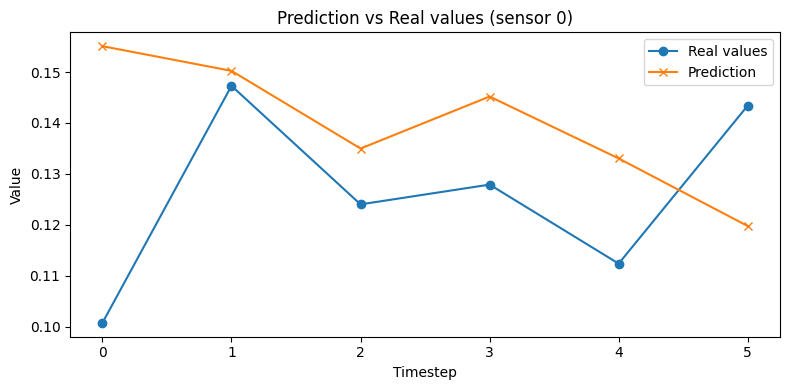

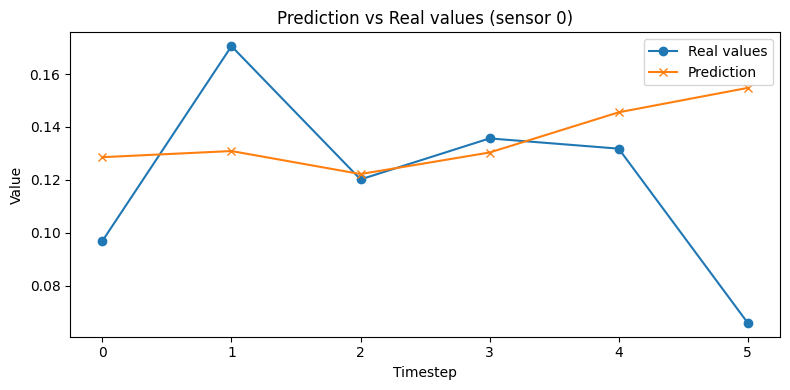

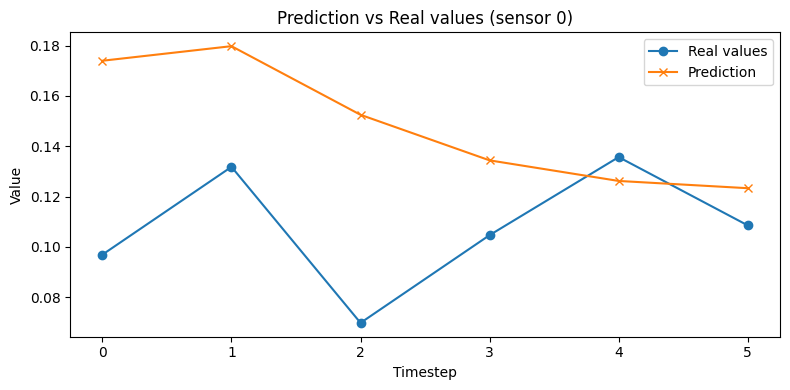

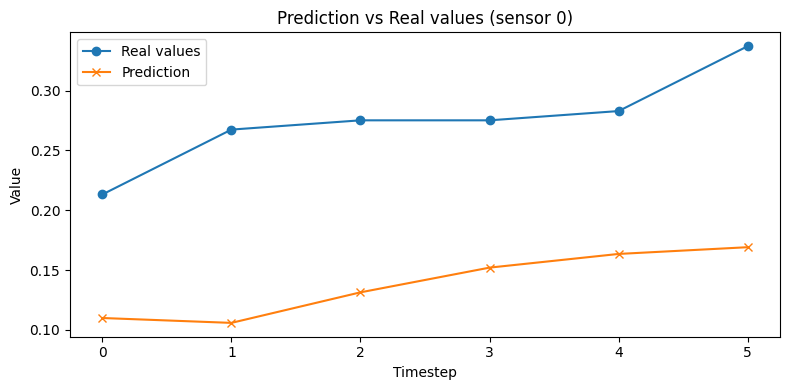

In [ ]:
plot_sample(model_temporal, X_test, y_test, pred_len= 6,selected_samples=[3,15, 30, 40], selected_sensor_idx = 0)